# New York’s Preference in What Cup of Drink

### 1. Background and Problem 


1.1 Background

Where is the most densely populated city in the United States? Of course, it’s New York. New York is definitely one of the places to start up a business. Think of the foot traffic!The convenient made to order drinks market make up a good portion of venues one sees when going out and about. These are the categories that I include in the CMTO(Convenient made to order) market: Coffee, Bubble Tea, Tea, and Juice.  “A market research study by Euromonitor …reveal[ed] that the American continent is a region that favors consumption of coffee versus tea. The United States consumes three times more coffee (75.4%) than tea (24.6%).” One can presume that coffee relative to other drinks in the category will overall be much more commonin New York.   

1.2 Problem

Let’s explore the profile for New York overll and each neighborhood. I want to see the numbers of locations for each type of drink/brand and what are the top brands people are going to for coffee, bubble tea, tea, and juice.  

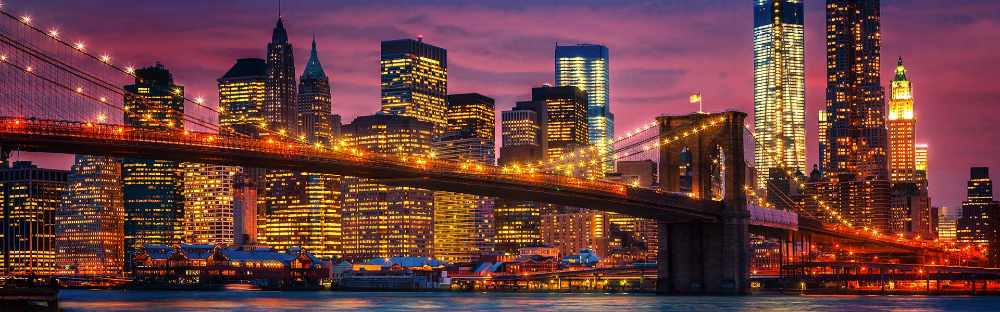

**Outline**

Obtain the Data

    1.a. Import the data from NYU website for New York's borough and neighborhood

    1.b. Obtain information about most popular boroughs and neighborhood.

    1.c. Use Foursquare Data to retrieve all drink-related venues for each neighborhood

Data Visualization and Some Simple Statistical Analysis.

    Analysis Using Clustering, Specially K-Means Clustering.

    3.a. Maximize the number of clusters.

    3.b. Visualization using Folium Map

    Analyze the Neighborhoods and note any observations       worth noting

    Inference From these Results and related Conclusions. 

### Target Audience

1. A new business owner can identify neighborhoods that lack a certain drink category and explore whether that area would be a good place to start his or her business. 
2. A potential resident could factor in the profiles of each neighborhood and find place to live based on their preferences for what type of drink.
3. A potential Data scientist who want to use some of the most used Exploratory Data Analysis techniques to obtain necessary data, analyze it and, finally be able to tell a story out of it. 

### 2. Data Acquisition and Cleaning

#### Import Libraries

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches # needed for waffle Charts

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library
from folium import plugins

from pywaffle import Waffle 

import seaborn as sns

%matplotlib inline

#### 2.1. Data Sources 

NYU Spatial Data Repository: I will be using the ‘2014 New York City Neighborhood Names’ dataset hosted by NYU’s Spatial Data Repository to obtain the boroughs and neighborhood.

Foursquare---’Place API’: I will be using Foursquare’s Places API to acquire data related to venues. 

##### Load and explore the data.

In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Explore the json data in a formatted way. So much cleaner than just a normal output! :))

In [4]:
#print(json.dumps(newyork_data,indent =5))

In [5]:
neighborhoods_data = newyork_data['features']
neighborhoods_data[0]


{'geometry': {'coordinates': [-73.84720052054902, 40.89470517661],
  'type': 'Point'},
 'geometry_name': 'geom',
 'id': 'nyu_2451_34572.1',
 'properties': {'annoangle': 0.0,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661],
  'borough': 'Bronx',
  'name': 'Wakefield',
  'stacked': 1},
 'type': 'Feature'}

### Process the Information From Json to Pandas Dataframe

** Create data frame and import data **

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [7]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


In [8]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


** Save dataframe to csv file. **

In [10]:
#neighborhoods.to_csv(path_or_buf='ny_neighborhoods.csv')

**Display the number of borough and neighborhood in New York.**

In [11]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


###  Use geopy library to get the latitude and longitude values of New York City.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent ny_explorer, as shown below.

In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


###### Create a map of New York with neighborhoods superimposed on top.

In [13]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

Add Heatmap Feature

###### Foursquare Credentials and Version

In [14]:
CLIENT_ID = 'LWGGYQKN1VUMEHM3MT3JC4CIWID13PGJEU1WUVRC4PWQPH0Z' # your Foursquare ID
CLIENT_SECRET = '253JZJCV15JJE5GCTPCJILGFJQPDTA3DDQSEEXZNY03QUV2W' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: LWGGYQKN1VUMEHM3MT3JC4CIWID13PGJEU1WUVRC4PWQPH0Z
CLIENT_SECRET:253JZJCV15JJE5GCTPCJILGFJQPDTA3DDQSEEXZNY03QUV2W


###### Target Venue Categories

In [15]:
Coffee_Shop = '4bf58dd8d48988d1e0931735'
Bubble_Tea_Shop ='52e81612bcbc57f1066b7a0c'
Juice_Bar = '4bf58dd8d48988d112941735'
Tea_Room = '4bf58dd8d48988d1dc931735'

###### Function to Create API Url

In [16]:
'''
def createURL(endpoint, CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, categoryId, limit):
    url = '{}&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&categoryId={}&limit={}'.format(
            endpoint,
            CLIENT_ID,
            CLIENT_SECRET,
            VERSION,
            lat,
            lng,
            radius,
            categoryId,
            limit
        )
    return url

endpoint = 'https://api.foursquare.com/v2/venues/search?'
categoryIds = [Coffee_Shop, Bubble_Tea_Shop, Juice_Bar, Tea_Room]
categoryId = ','.join(categoryIds)
limit = 100                                                                                                                    
'''

"\ndef createURL(endpoint, CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, categoryId, limit):\n    url = '{}&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&categoryId={}&limit={}'.format(\n            endpoint,\n            CLIENT_ID,\n            CLIENT_SECRET,\n            VERSION,\n            lat,\n            lng,\n            radius,\n            categoryId,\n            limit\n        )\n    return url\n\nendpoint = 'https://api.foursquare.com/v2/venues/search?'\ncategoryIds = [Coffee_Shop, Bubble_Tea_Shop, Juice_Bar, Tea_Room]\ncategoryId = ','.join(categoryIds)\nlimit = 100                                                                                                                    \n"

###### Function To Retrieve All Drinks-Related Venues Per Neighborhood

In [17]:
'''
def getNearbyMusicVenues(neighborhoods, latitudes, longitudes, radius=1000):
    endpoint = 'https://api.foursquare.com/v2/venues/search?'
    venues_list = []   
    
    for hood_name, lat, lng in zip(neighborhoods, latitudes, longitudes):
    
        url = createURL(endpoint, CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, categoryId, limit)
        
        results = requests.get(url).json()['response']['venues']

        for item in results:
            venue_name = item['name']
            venue_category = item['categories'][0]['name']
            venue_lat = item['location']['lat']
            venue_lng = item['location']['lng']
            try:
                venue_city = item['location']['city']
            except:
                venue_city = 'N/A'
            venue_state = item['location']['state']
            
            venues_list.append([(hood_name,
                                lat,
                                lng,
                                venue_name,
                                venue_category,
                                venue_lat,
                                venue_lng,
                                venue_city,
                                venue_state
                               )])
            
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                             'Neighborhood Latitude',
                             'Neighborhood Longitude',
                             'Venue Name',
                             'Venue Category',
                             'Venue Latitude',
                             'Venue Longitude',
                             'Venue City',
                             'Venue State'
                            ]
    return nearby_venues

prelim_venue_data = getNearbyMusicVenues(neighborhoods['Neighborhood'],
                                         neighborhoods['Latitude'],
                                         neighborhoods['Longitude'],
                                        )
'''

"\ndef getNearbyMusicVenues(neighborhoods, latitudes, longitudes, radius=1000):\n    endpoint = 'https://api.foursquare.com/v2/venues/search?'\n    venues_list = []   \n    \n    for hood_name, lat, lng in zip(neighborhoods, latitudes, longitudes):\n    \n        url = createURL(endpoint, CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, categoryId, limit)\n        \n        results = requests.get(url).json()['response']['venues']\n\n        for item in results:\n            venue_name = item['name']\n            venue_category = item['categories'][0]['name']\n            venue_lat = item['location']['lat']\n            venue_lng = item['location']['lng']\n            try:\n                venue_city = item['location']['city']\n            except:\n                venue_city = 'N/A'\n            venue_state = item['location']['state']\n            \n            venues_list.append([(hood_name,\n                                lat,\n                                lng,\n              

In [18]:
#print(prelim_venue_data.shape)
#prelim_venue_data.head(5)

** Save Foursquare data to csv file due to limited api calls **

In [19]:
#prelim_venue_data.to_csv(path_or_buf='prelim_venue_data.csv')

### 3. Exploratory Data Analysis

**  Read CSV File. **

In [20]:
prelim_venue_data = pd.read_csv('prelim_venue_data.csv', index_col=0)
prelim_venue_data.head(5)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.898390,-73.854643,Bronx,NY
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY


In [21]:
prelim_venue_data.tail(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
5503,Queensbridge,40.756091,-73.945631,Triple Shot World Atlas,Coffee Shop,40.750256,-73.939591,Long Island City,NY
5504,Queensbridge,40.756091,-73.945631,The Local Bar and Cafe,Bar,40.749316,-73.947724,Long Island City,NY
5505,Queensbridge,40.756091,-73.945631,Clever Blend Lic,Coffee Shop,40.750228,-73.939608,New York,NY
5506,Queensbridge,40.756091,-73.945631,The Mill Coffee Company,Coffee Shop,40.748350,-73.949604,Queens,NY
5507,Queensbridge,40.756091,-73.945631,Starbucks,Coffee Shop,40.746729,-73.943920,Queens,NY
5508,Fox Hills,40.617311,-74.081740,Coloring Eggs With The Kids,Tea Room,40.614070,-74.082269,NaN,New York
5509,Fox Hills,40.617311,-74.081740,debum's juicer,Juice Bar,40.618178,-74.085242,Staten Island,NY
5510,Fox Hills,40.617311,-74.081740,Best Coffee Shop,Coffee Shop,40.627100,-74.077970,Staten Island,NY
5511,Fox Hills,40.617311,-74.081740,Foundation Starbucks Cafe,Coffee Shop,40.613686,-74.093818,Staten Island,NY
5512,Fox Hills,40.617311,-74.081740,Starbucks,Coffee Shop,40.615535,-74.092930,Staten Island,NY


** Check that all venues are in the New York or NY area. **

In [22]:
prelim_venue_data.groupby('Venue State')['Venue State'].count()

Venue State
MD             1
NY          5436
New York      76
Name: Venue State, dtype: int64

**  See number of venue categories. Limit down to the target ones. **

In [23]:
n_unique = len(prelim_venue_data['Venue Category'].unique())
print(f'There are {n_unique} unique venue categories in this dataframe')
prelim_venue_data.groupby('Venue Category')['Venue Category'].count().sort_values(ascending=False)


There are 77 unique venue categories in this dataframe


Venue Category
Coffee Shop                                 2727
Donut Shop                                   906
Juice Bar                                    725
Bubble Tea Shop                              240
Café                                         190
Tea Room                                     126
Bakery                                        91
Dessert Shop                                  39
Sandwich Place                                37
Ice Cream Shop                                30
Bagel Shop                                    28
Vegetarian / Vegan Restaurant                 26
Diner                                         25
Bar                                           23
Deli / Bodega                                 18
Vietnamese Restaurant                         18
Breakfast Spot                                17
American Restaurant                           17
Mexican Restaurant                            13
Clothing Store                                12
Itali

** Remove non New York venus and make venue state uniform. **

In [24]:
ny_venue_data = prelim_venue_data[(prelim_venue_data['Venue State'] == "New York") | (prelim_venue_data['Venue State'] == "NY")]
ny_venue_data['Venue State'].replace(to_replace="New York", value="NY", inplace=True)
delta = prelim_venue_data.shape[0] - ny_venue_data.shape[0]
print(f'{delta} entries were removed from the preliminary dataset based on "Venue State"')
ny_venue_data.head(10)

1 entries were removed from the preliminary dataset based on "Venue State"


C:\Anaconda3\lib\site-packages\pandas\core\generic.py:6586: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.898390,-73.854643,Bronx,NY
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY
5,Co-op City,40.874294,-73.829939,Juice Bar,Juice Bar,40.876156,-73.829506,Bronx,NY
6,Co-op City,40.874294,-73.829939,Dunkin',Coffee Shop,40.869706,-73.829518,Bronx,NY
7,Co-op City,40.874294,-73.829939,Starbucks,Coffee Shop,40.865617,-73.827263,Bronx,NY
8,Co-op City,40.874294,-73.829939,Dunkin',Donut Shop,40.881118,-73.838137,Bronx,NY
9,Co-op City,40.874294,-73.829939,Dunkin',Donut Shop,40.885384,-73.828099,Bronx,NY


** Remove any null values in Venue City. **

In [25]:
ny_venue_data_with_city = ny_venue_data[(ny_venue_data['Venue City'] != "nan")]
delta = ny_venue_data.shape[0] - ny_venue_data_with_city.shape[0]
print(f'{delta} entries were removed based on "Venue City"')
ny_venue_data_with_city.head(5)


0 entries were removed based on "Venue City"


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.898390,-73.854643,Bronx,NY
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY


** Check values on categories and change donut shop to coffee shop **

In [26]:
ny_venue_data_with_city['Venue Category'].value_counts()

Coffee Shop                                 2726
Donut Shop                                   906
Juice Bar                                    725
Bubble Tea Shop                              240
Café                                         190
Tea Room                                     126
Bakery                                        91
Dessert Shop                                  39
Sandwich Place                                37
Ice Cream Shop                                30
Bagel Shop                                    28
Vegetarian / Vegan Restaurant                 26
Diner                                         25
Bar                                           23
Vietnamese Restaurant                         18
Deli / Bodega                                 18
American Restaurant                           17
Breakfast Spot                                17
Mexican Restaurant                            13
Clothing Store                                12
Italian Restaurant  

In [27]:
ny_venue_data_with_city[ny_venue_data_with_city.loc[:,'Venue Category']=='Donut Shop']

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Donut Shop,40.898390,-73.854643,Bronx,NY
8,Co-op City,40.874294,-73.829939,Dunkin',Donut Shop,40.881118,-73.838137,Bronx,NY
9,Co-op City,40.874294,-73.829939,Dunkin',Donut Shop,40.885384,-73.828099,Bronx,NY
10,Eastchester,40.887556,-73.827806,Dunkin',Donut Shop,40.885384,-73.828099,Bronx,NY
12,Eastchester,40.887556,-73.827806,Dunkin',Donut Shop,40.894054,-73.824016,Mount Vernon,NY
13,Eastchester,40.887556,-73.827806,Dunkin',Donut Shop,40.881118,-73.838137,Bronx,NY
14,Fieldston,40.895437,-73.905643,Dunkin',Donut Shop,40.890162,-73.898399,Bronx,NY
16,Fieldston,40.895437,-73.905643,Dunkin',Donut Shop,40.885621,-73.910375,Bronx,NY


In [28]:
ny_venue_data_with_city.dropna(inplace = True)

**Remove all but the 4 categories and change donut shop venue category to coffee shop**

In [29]:
ny_venue_data_with_city.loc[ny_venue_data_with_city['Venue Category'] =='Donut Shop', 'Venue Category'] = 'Coffee Shop'
for_drinks = ny_venue_data_with_city.loc[ny_venue_data_with_city['Venue Category'].isin(['Coffee Shop', 'Juice Bar', 'Bubble Tea Shop', 'Tea Room'])]

In [30]:
for_drinks.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.898390,-73.854643,Bronx,NY
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY


In [31]:
for_drinks.columns

Index(['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
       'Venue Name', 'Venue Category', 'Venue Latitude', 'Venue Longitude',
       'Venue City', 'Venue State'],
      dtype='object')

### Heat Map 

In [32]:
# Ensure elements are float
for_drinks['Venue Latitude'] = for_drinks['Venue Latitude'].astype(float)
for_drinks['Venue Longitude'] = for_drinks['Venue Longitude'].astype(float)

# Put the Venue Latitude and Longitude into a list
dvenueList = [[row['Venue Latitude'],row['Venue Longitude']] for index, row in for_drinks.iterrows()]

# Add heatmap
map_newyork.add_children(plugins.HeatMap(dvenueList, radius=15))
# Display on map
map_newyork

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  if __name__ == '__main__':


In [33]:
print("Drinks dataframe now has", for_drinks.shape[0], "rows")

Drinks dataframe now has 4647 rows


In [34]:
for_drinks.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State
0,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.890459,-73.849089,Bronx,NY
1,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.893064,-73.856977,Bronx,NY
2,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.898390,-73.854643,Bronx,NY
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY
5,Co-op City,40.874294,-73.829939,Juice Bar,Juice Bar,40.876156,-73.829506,Bronx,NY
6,Co-op City,40.874294,-73.829939,Dunkin',Coffee Shop,40.869706,-73.829518,Bronx,NY
7,Co-op City,40.874294,-73.829939,Starbucks,Coffee Shop,40.865617,-73.827263,Bronx,NY
8,Co-op City,40.874294,-73.829939,Dunkin',Coffee Shop,40.881118,-73.838137,Bronx,NY
9,Co-op City,40.874294,-73.829939,Dunkin',Coffee Shop,40.885384,-73.828099,Bronx,NY


In [35]:
neighbors = for_drinks.pivot_table(index='Neighborhood', columns='Venue Category', 
                        aggfunc=len, fill_value=0)['Venue City']


neighbors = neighbors/neighbors.sum(axis=0)
neighbors['Neighborhood'] = neighbors.index
neighbors = neighbors.reset_index(drop=True)
neighbors.head()


Venue Category,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Neighborhood
0,0.0,0.002232,0.001418,0.0,Allerton
1,0.0,0.000279,0.000000,0.0,Arden Heights
2,0.0,0.000558,0.001418,0.0,Arlington
3,0.0,0.000000,0.004255,0.0,Arrochar
4,0.0,0.000558,0.000000,0.0,Arverne


### Waffle Chart Function

In [36]:
dtype_count = for_drinks['Venue Category'].value_counts()

In [37]:
for_drinks['Venue Category'].value_counts()

Coffee Shop        3584
Juice Bar           705
Bubble Tea Shop     240
Tea Room            118
Name: Venue Category, dtype: int64

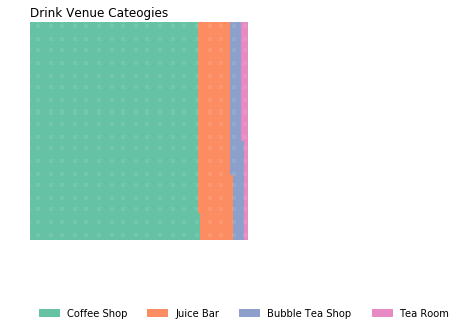

In [38]:
fig = plt.figure(
    FigureClass=Waffle, 
    rows=100,
    columns=100,
    values=list(dtype_count.values),
    labels=list(dtype_count.index),
    title={'label': 'Drink Venue Cateogies', 'loc': 'left'},
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
    
)

fig.set_tight_layout(False)
plt.show()

### 3.1 Bar Charts

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


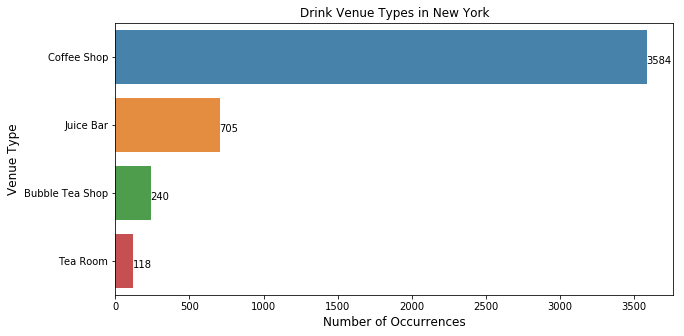

In [39]:
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(dtype_count.values,dtype_count .index, alpha=0.9)

plt.title('Drink Venue Types in New York')
plt.ylabel('Venue Type', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width - 1.5   , p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

In [40]:
drink_count = for_drinks['Venue Name'].value_counts()

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


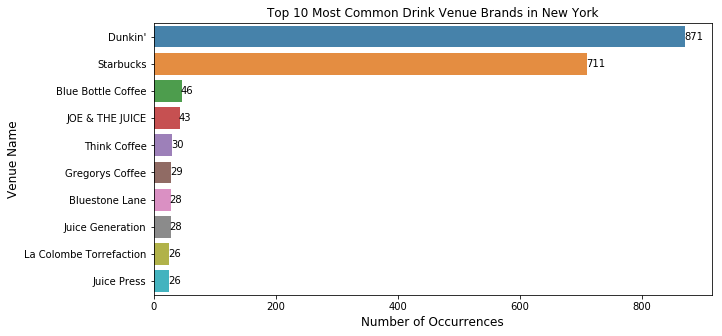

In [41]:
drink_count = drink_count[:10,]
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(drink_count.values,drink_count.index, alpha=0.9)

plt.title('Top 10 Most Common Drink Venue Brands in New York')
plt.ylabel('Venue Name', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width - 1.5   , p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

** Clean up data same venue names in Bubble Tea Shops, but different variations. **

In [42]:
bts = for_drinks[for_drinks.loc[:,'Venue Category'] == 'Bubble Tea Shop']

In [43]:
bts.loc[bts['Venue Name'] =='Kung Fu Tea (功夫茶)', 'Venue Name'] = 'Kung Fu Tea'
bts.loc[bts['Venue Name'] =='Kung Fu Tea 功夫茶', 'Venue Name'] = 'Kung Fu Tea'

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [44]:
bts.loc[bts['Venue Name'] =='Gong Cha 貢茶 (Gong Cha)', 'Venue Name'] = 'Gong Cha'

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [45]:

bts_count = bts['Venue Name'].value_counts()

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


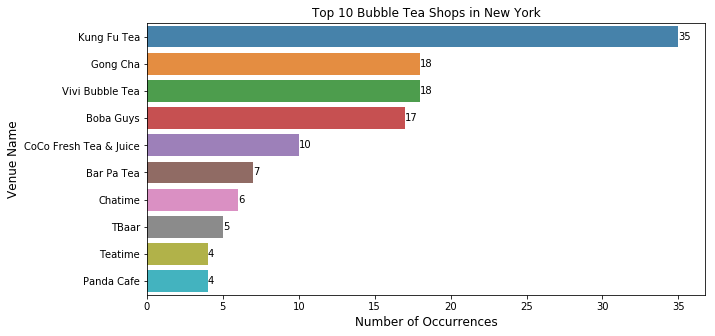

In [46]:
bts_count = bts_count[:10,]
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(bts_count.values,bts_count.index, alpha=0.9)

plt.title('Top 10 Bubble Tea Shops in New York')
plt.ylabel('Venue Name', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width, p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

In [47]:
coffee = for_drinks[for_drinks.loc[:,'Venue Category'] == 'Coffee Shop']
coffee_count = coffee['Venue Name'].value_counts()

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


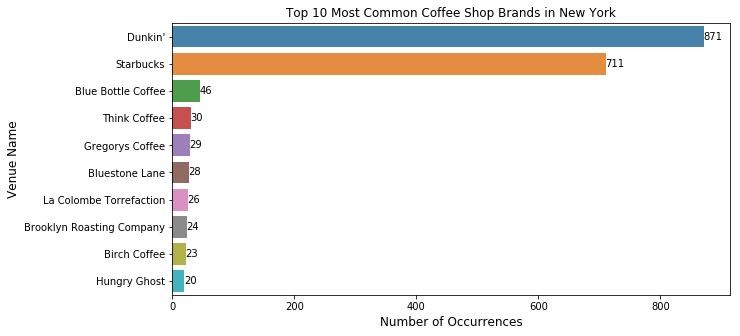

In [48]:
coffee_count = coffee_count[:10,]
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(coffee_count.values,coffee_count.index, alpha=0.9)

plt.title('Top 10 Most Common Coffee Shop Brands in New York')
plt.ylabel('Venue Name', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width-1, p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

In [49]:
juice = for_drinks[for_drinks.loc[:,'Venue Category'] == 'Juice Bar']
juice_count =juice['Venue Name'].value_counts()

In [50]:
juice.columns

Index(['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
       'Venue Name', 'Venue Category', 'Venue Latitude', 'Venue Longitude',
       'Venue City', 'Venue State'],
      dtype='object')

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


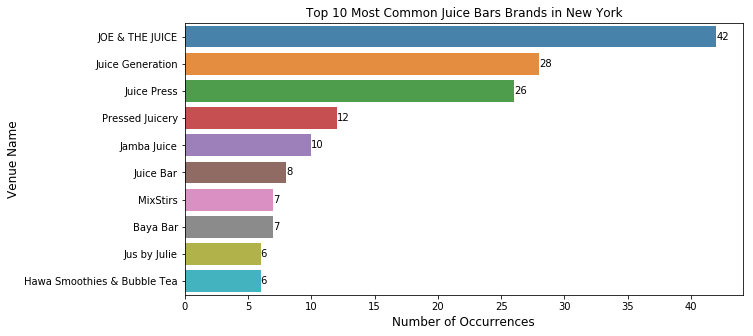

In [51]:
juice_count = juice_count[:10,]
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(juice_count.values,juice_count.index, alpha=0.9)

plt.title('Top 10 Most Common Juice Bars Brands in New York')
plt.ylabel('Venue Name', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width, p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

In [52]:
tea = for_drinks[for_drinks.loc[:,'Venue Category'] == 'Tea Room']
tea.loc[tea['Venue Name'] =='TBaar', 'Venue Name'] = 'T Baar'
tea_count =tea['Venue Name'].value_counts()

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [53]:
tea['Venue Name'].value_counts()

Cha Cha Matcha                            7
Matchaful                                 7
Prince Tea House                          7
T Baar                                    7
Argo Tea                                  5
Big Macs House                            3
cafe de rockaway                          3
coco fresh Tea & juice                    3
HoM Bay Ridge                             3
Tavalon Tea Bar @ St John's University    2
T2 Tea                                    2
Tea Cup Cafe                              2
Loose Leaf                                2
CoCo Fresh Tea & Juice                    2
Kettl                                     2
Downton                                   2
Mamselles Teas and Tarts                  2
Glitter Kitchen                           2
InToTea                                   2
Brooklyn Tea                              2
Harney & Sons                             2
Kungfu                                    2
Kissena Cafe                    

C:\Anaconda3\lib\site-packages\seaborn\categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


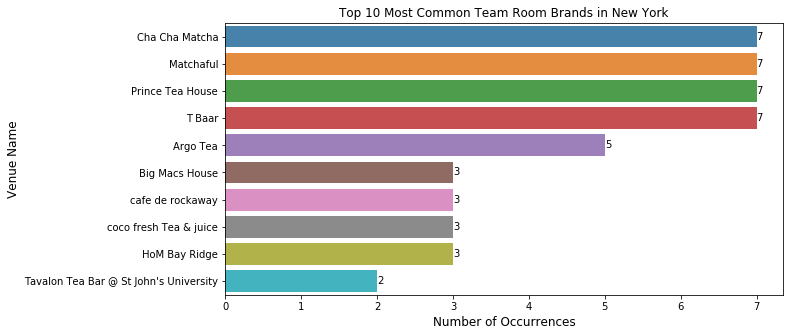

In [54]:
tea_count = tea_count[:10,]
plt.figure(figsize=(15,10))
fig, ax = plt.subplots(figsize=(10,5)) 
sns.barplot(tea_count.values,tea_count.index, alpha=0.9)

plt.title('Top 10 Most Common Team Room Brands in New York')
plt.ylabel('Venue Name', fontsize=12)
plt.xlabel('Number of Occurrences', fontsize=12)

for p in ax.patches:
    width = p.get_width()
    ax.text(width, p.get_y()+p.get_height()/2. + 0.1,'{:1.0f}'.format(width), ha="left")
    
plt.show()

In [55]:
for_drinks.columns

Index(['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
       'Venue Name', 'Venue Category', 'Venue Latitude', 'Venue Longitude',
       'Venue City', 'Venue State'],
      dtype='object')

**Find neighborhoods with the most of each Drink Type** 

In [56]:
#neighbors.rename(columns={'Venue Name': 'count'}, inplace=True)

In [57]:
#max_drink = neighbors[neighbors['count'] == neighbors.groupby(['Venue Category'])['count'].transform(max)]
#max_drink['count']

### 3.2. Clustering 

In [58]:
neighbors

Venue Category,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Neighborhood
0,0.000000,0.002232,0.001418,0.000000,Allerton
1,0.000000,0.000279,0.000000,0.000000,Arden Heights
2,0.000000,0.000558,0.001418,0.000000,Arlington
3,0.000000,0.000000,0.004255,0.000000,Arrochar
4,0.000000,0.000558,0.000000,0.000000,Arverne
5,0.012500,0.008650,0.007092,0.025424,Astoria
6,0.000000,0.001116,0.000000,0.000000,Astoria Heights
7,0.000000,0.001395,0.002837,0.000000,Auburndale
8,0.025000,0.002511,0.004255,0.042373,Bath Beach
9,0.004167,0.010603,0.007092,0.000000,Battery Park City


** Run k means to cluster the neighborhood into five clusters. **

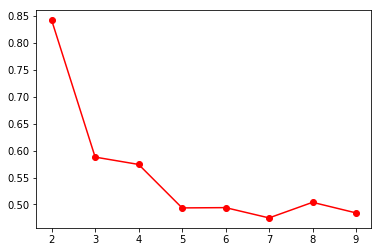

In [59]:
from sklearn.metrics import silhouette_score

neighborhood = neighbors['Neighborhood']
neighbors= neighbors.drop('Neighborhood', 1)
# set number of clusters
perf_sil = []
for kclusters in range(2,10):
    # run k-means clustering
    kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(neighbors)

    # check cluster labels generated for each row in the dataframe
    labels = kmeans.labels_
    perf_sil.append(silhouette_score(neighbors,labels))

plt.plot(range(2,10),perf_sil,'-or')

In [60]:
neighbors['Neighborhood'] = neighborhood
neighbors['Cluster Labels'] = kmeans.labels_
neighbors.head()

Venue Category,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Neighborhood,Cluster Labels
0,0.0,0.002232,0.001418,0.0,Allerton,1
1,0.0,0.000279,0.000000,0.0,Arden Heights,1
2,0.0,0.000558,0.001418,0.0,Arlington,1
3,0.0,0.000000,0.004255,0.0,Arrochar,1
4,0.0,0.000558,0.000000,0.0,Arverne,1


In [61]:
for_drinks = for_drinks.join(neighbors.set_index('Neighborhood'), on='Neighborhood')
for_drinks.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue City,Venue State,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Cluster Labels
0,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.890459,-73.849089,Bronx,NY,0.0,0.001116,0.001418,0.0,1
1,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.893064,-73.856977,Bronx,NY,0.0,0.001116,0.001418,0.0,1
2,Wakefield,40.894705,-73.847201,Dunkin',Coffee Shop,40.898390,-73.854643,Bronx,NY,0.0,0.001116,0.001418,0.0,1
3,Wakefield,40.894705,-73.847201,Starbucks,Coffee Shop,40.888920,-73.846220,Bronx,NY,0.0,0.001116,0.001418,0.0,1
4,Wakefield,40.894705,-73.847201,Island Juice Bar,Juice Bar,40.901695,-73.846672,Bronx,NY,0.0,0.001116,0.001418,0.0,1


In [62]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(for_drinks['Venue Latitude'], for_drinks['Venue Longitude'],for_drinks['Neighborhood'],for_drinks['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [63]:
# Examine Cluster 0
for_drinks.loc[for_drinks['Cluster Labels'] == 0, for_drinks.columns[[1] + list(range(5, for_drinks.shape[1]))]]

,Neighborhood Latitude,Venue Latitude,Venue Longitude,Venue City,Venue State,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Cluster Labels
201,40.836623,40.835443,-73.920993,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
202,40.836623,40.828938,-73.926216,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
203,40.836623,40.826418,-73.924056,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
204,40.836623,40.825546,-73.918948,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
206,40.836623,40.840851,-73.921433,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
208,40.836623,40.838932,-73.914925,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
209,40.836623,40.839188,-73.916214,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
210,40.836623,40.825556,-73.918865,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
211,40.836623,40.828239,-73.925864,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0
212,40.836623,40.839821,-73.914261,Bronx,NY,0.004167,0.002232,0.007092,0.008475,0


In [64]:
for_drinks.loc[for_drinks['Cluster Labels'] == 1, for_drinks.columns[[1] + list(range(5, for_drinks.shape[1]))]]

,Neighborhood Latitude,Venue Latitude,Venue Longitude,Venue City,Venue State,Bubble Tea Shop,Coffee Shop,Juice Bar,Tea Room,Cluster Labels
0,40.894705,40.890459,-73.849089,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
1,40.894705,40.893064,-73.856977,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
2,40.894705,40.898390,-73.854643,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
3,40.894705,40.888920,-73.846220,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
4,40.894705,40.901695,-73.846672,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
5,40.874294,40.876156,-73.829506,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
6,40.874294,40.869706,-73.829518,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
7,40.874294,40.865617,-73.827263,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
8,40.874294,40.881118,-73.838137,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1
9,40.874294,40.885384,-73.828099,Bronx,NY,0.000000,0.001116,0.001418,0.000000,1


### 4. Results

1.  Overall, Starbucks and Dunkin'' Donuts dominate the space in drink venues. Coffee is also the most common drink type             and populate2 x out of 10 the most common drink brands in New York. 
2.  The second most common drink venue type is Juice Bar.
3.  Tea Rooms are the least common and make up 2.5 % of the entire drink market space.
4.  Joe & the Juice is the most common juice bar in New York.
5.  Jamba Juice is the fifth most common juice bar in New York.
6.  Four way tie between most common team rooms in New York: Cha Cha Matcha, Matachaful, Prince Tea House, and Tea Baar.
7.  The neighborhoods that have the most of each drink type are located in Brooklyn, Manhattan, and Queens borough. This 
    corresponds with the heat map.


### 5. Discussion

Overall, coffee shops dominate the type of drink palce compared to the other categories. Coffee shops make up over 75 % of the drink categories. Juice bars are second. This came as a bit of surprise to me. My expectation coming in to the project was that juice bars, bubble tea, and team rooms were all fairly close in numbers. Juice bars have 15% of the total drink places.

There is an overlap with tea rooms and bubble tea places. Bubble tea also serve tea, but it is more of fast casual style. While tea rooms generally have higher quality tea, less casual, and different ambience. I could also remove the tea room category, although it doesn't make up a huge percentage of drink places and doesn't greatly affect the data if I leave it in. 

Looking at Jamba Juice, a well known smoothie and juice venue, it is interesting to note how common it is among juice bars. Unfortunately, the Foursquare api doensn't have a smoothie category. It would be interesting to see where Jamba Juice ranks among smoothie venues.

All the categories except the tea room have clear venue brands that dominate the space in New York. For example, Starbucks and Dunkin' are the most common coffee shops. Kung Fu tea has significantly more bubble tea shops compared to the rest. In tea room venues, four of the most common tea rooms have the same exact number of locations, 7. In regards to Dunkin', I could also look at the the donut shop categories in New york and see where Dunkin' ranks among them. Many people might go to Dunkin' just for the donuts and not necessarily for the coffee. This is what they are known for, hence their brand name. I could also remove all the Dunkin Donuts entries too because some people wouldn't necessarily consider going to Dunkin Donut for their coffee. This will affect the data a bit in the k mean clustering algorithm.

Through clustering analysis, it was observed that ehre is similarity in drinks between: Bronx and New York(cluster 0) - abscence of tea shop and bubble tea shops, as well as few coffee shop and juice bars. One can look at the cluster profiles to see the similarities and differences between and within the clusters.



### 6. Conclusion

In conclusion, I got a small glimpse in formulating a problem, using exploratory data analysis, and utilizing a machine learning technique. I practiced with frequetly used python libraries, used Foursquare API to explore the drink venues in New York, and visualized the results of clustering using Folium leaflet map. Some drawback with this analysis was only being to utilize the locations and not the statistical data for each location. Venue owners are only allowed to access this data. Finally, the number of locations aligned partially with my initial thinking, but also found some interesting observations, particularly the number of juice bars.